# Import

In [1]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import optuna
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    cross_val_score,
    GridSearchCV
)
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    roc_auc_score,
    classification_report,
    confusion_matrix,
    RocCurveDisplay
)
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from statsmodels.stats.outliers_influence import variance_inflation_factor
from xgboost import plot_importance
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# Dataset Overview

In [2]:
df = pd.read_excel("credit_risk_case.xlsx")
print("Shape:", df.shape)
print("\nColumn Types:\n", df.dtypes)
print("\nFirst 5 rows:")
display(df.head())

Shape: (15000, 20)

Column Types:
 id                    int64
member_id            object
loan_amnt           float64
funded_amnt         float64
funded_amnt_inv     float64
term                  int64
installment         float64
emp_title            object
emp_length           object
annual_inc          float64
delinq_2yrs         float64
open_acc            float64
total_acc           float64
total_pymnt         float64
total_pymnt_inv     float64
last_pymnt_amnt     float64
tot_coll_amt        float64
tot_cur_bal         float64
total_rev_hi_lim    float64
default               int64
dtype: object

First 5 rows:


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,installment,emp_title,emp_length,annual_inc,delinq_2yrs,open_acc,total_acc,total_pymnt,total_pymnt_inv,last_pymnt_amnt,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,default
0,1,M0000001,16795.0,16505.0,15094.0,36,32.66,Data Scientist,9 years,228362.0,0.0,6.0,12.0,1459.92,1377.66,39.12,191.0,30634.0,13996.0,0
1,2,M0000002,1860.0,1848.0,1494.0,60,2.17,Developer,7 years,273685.0,1.0,14.0,20.0,137.61,133.20,1.74,60.0,158169.0,97196.0,0
2,3,M0000003,39158.0,37619.0,34683.0,36,76.14,Manager,1 year,165933.0,0.0,11.0,17.0,2688.63,2460.36,77.56,65.0,66504.0,31634.0,0
3,4,M0000004,12284.0,12266.0,11096.0,60,14.33,Manager,9 years,136818.0,0.0,7.0,16.0,980.01,907.17,13.45,50.0,101207.0,99850.0,0
4,5,M0000005,7265.0,6953.0,6651.0,60,8.48,Analyst,2 years,114755.0,0.0,13.0,15.0,513.38,508.43,8.86,88.0,108914.0,68794.0,0


**Sütun anlamları**

- member_id: Her bir müşteriye ait benzersiz tanımlayıcı.

- loan_amnt: Müşterinin talep ettiği kredi tutarı.

- funded_amnt: Finans kurumu veya platform tarafından gerçekte fonlanan kredi tutarı.

- funded_amnt_inv: Yatırımcılar tarafından fonlanan kredi miktarı (özellikle marketplace lending sistemlerinde).

- term: Kredinin vadesi (ay cinsinden, örn. 36 ay veya 60 ay).

- installment: Müşterinin her ay ödemesi gereken sabit taksit tutarı.

- emp_title: Müşterinin iş unvanı.

- emp_length: Müşterinin kaç yıldır çalıştığı.

- annual_inc: Müşterinin yıllık geliri.

- delinq_2yrs: Son iki yıl içinde yaşanan gecikmiş ödeme sayısı.

- open_acc: Müşterinin aktif kredi hesaplarının toplam sayısı.

- total_acc: Müşterinin bugüne kadar sahip olduğu tüm kredi hesaplarının toplam sayısı. Kredi geçmişinin uzunluğunu ve çeşitliliğini gösterir.

- total_pymnt: Müşteri tarafından bugüne kadar yapılan toplam ödeme miktarı.

- total_pymnt_inv: Yatırımcılara yapılan toplam ödeme miktarı.

- last_pymnt_amnt: Müşteri tarafından yapılan son ödemenin tutarı.

- tot_coll_amt: Tahsilata (collection) devredilen toplam borç miktarı.

- tot_cur_bal: Müşterinin tüm kredi hesaplarındaki mevcut toplam borç bakiyesi.

- total_rev_hi_lim: Müşterinin toplam kredi kartı limiti + diğer dönen kredi limitlerinin toplamıdır.

- default: Hedef değişken. 0 = Kredi normal şekilde ödenmiş | 1 = Kredi temerrüde düşmüş (default).

In [3]:
# Gereksiz sütunları silelim.
if 'id' in df.columns:
    df.drop('id', axis=1, inplace=True)

if 'member_id' in df.columns:
    df.drop('member_id', axis=1, inplace=True)

Default Rate %
 default
0    97.0
1     3.0
Name: count, dtype: float64


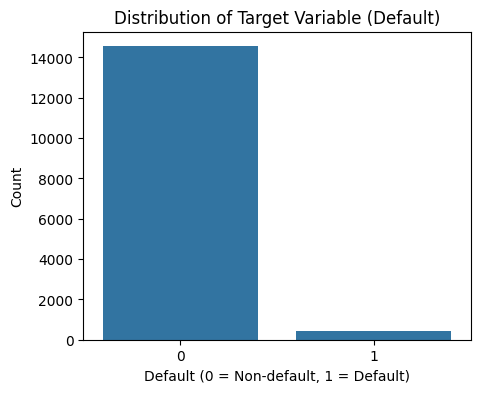

In [4]:
# Target değişkenimizin oranına bakalım.
print("Default Rate %\n",(df['default'].value_counts().T / df.shape[0]) * 100)

plt.figure(figsize=(5,4))
sns.countplot(x="default", data=df)
plt.title("Distribution of Target Variable (Default)")
plt.xlabel("Default (0 = Non-default, 1 = Default)")
plt.ylabel("Count")
plt.show()

Veri setinde belirgin bir sınıf dengesizliği (**class imbalance**) var. Default sınıfı, tüm örneklerin çok küçük bir kısmını oluşturmaktadır. Bu durum çeşitli açılardan kritik sonuçlar doğurur:
- Accuracy bu problemde güvenilir bir metrik değildir.
- Bunun yerine ROC-AUC, Precision-Recall AUC, Recall ve sınıf 1’e ait F1-Score çok daha anlamlı olacaktır.
- SMOTE, class_weight ayarı gibi yöntemlerin uygulanması gerekebilir.

In [5]:
# Numerik - Kategorik sütunları ayıralım.
numeric_cols = df.select_dtypes(include=["int64", "float64"]).columns.tolist()
categorical_cols = df.select_dtypes(include=["object"]).columns.tolist()

# Numerik sütunlar arasından default'u çıkaralım.
if "default" in numeric_cols:
    numeric_cols.remove("default")

categorical_like = [
    "term",          # 36 - 60
    "emp_length",    # years
    "default"        # 0 - 1
]


for col in categorical_like:
    if col in numeric_cols:
        numeric_cols.remove(col)


for col in categorical_like:
    if col not in categorical_cols:
        categorical_cols.append(col)


print("Numerik Sütunlar:")
print(numeric_cols)
print("\nKategorik Sütunlar:")
print(categorical_cols)

Numerik Sütunlar:
['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment', 'annual_inc', 'delinq_2yrs', 'open_acc', 'total_acc', 'total_pymnt', 'total_pymnt_inv', 'last_pymnt_amnt', 'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim']

Kategorik Sütunlar:
['emp_title', 'emp_length', 'term', 'default']


## Numerical Feature Analysis

In [6]:
# Numerik sütunların özeti
summary_stats = df[numeric_cols].describe().T
summary_stats

,count,mean,std,min,25%,50%,75%,max
loan_amnt,14956.0,20443.202327,11219.671340,1002.00,10715.7500,20551.500,29927.000,39997.00
funded_amnt,14860.0,19944.691723,10945.424487,961.00,10476.2500,20048.500,29247.500,39944.00
funded_amnt_inv,14844.0,17925.496699,9933.053209,788.00,9333.5000,17933.000,26233.750,39484.00
installment,14991.0,34.990071,20.914815,1.17,17.3400,33.350,50.230,77.77
annual_inc,14762.0,188249.452513,93611.442565,25003.00,107646.2500,189132.000,268388.250,349971.00
delinq_2yrs,14985.0,0.195796,0.441713,0.00,0.0000,0.000,0.000,4.00
open_acc,14986.0,9.029828,2.999963,0.00,7.0000,9.000,11.000,24.00
total_acc,14970.0,15.041283,3.853334,2.00,12.0000,15.000,18.000,32.00
total_pymnt,14788.0,1499.938343,854.035235,62.18,777.5775,1471.825,2162.950,3626.99
total_pymnt_inv,14850.0,1424.212145,812.972855,59.25,735.9500,1400.525,2052.885,3497.98


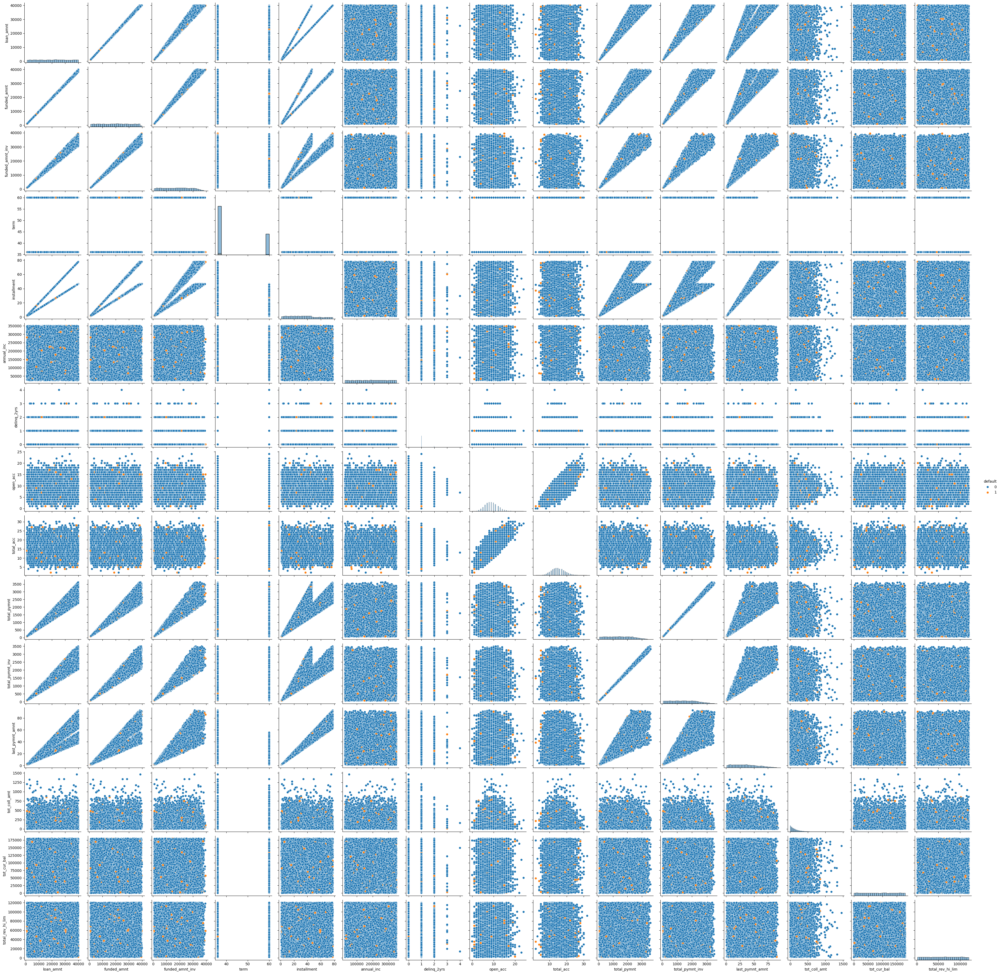

In [7]:
sns.pairplot(df, hue="default", diag_kind="hist")
plt.show()

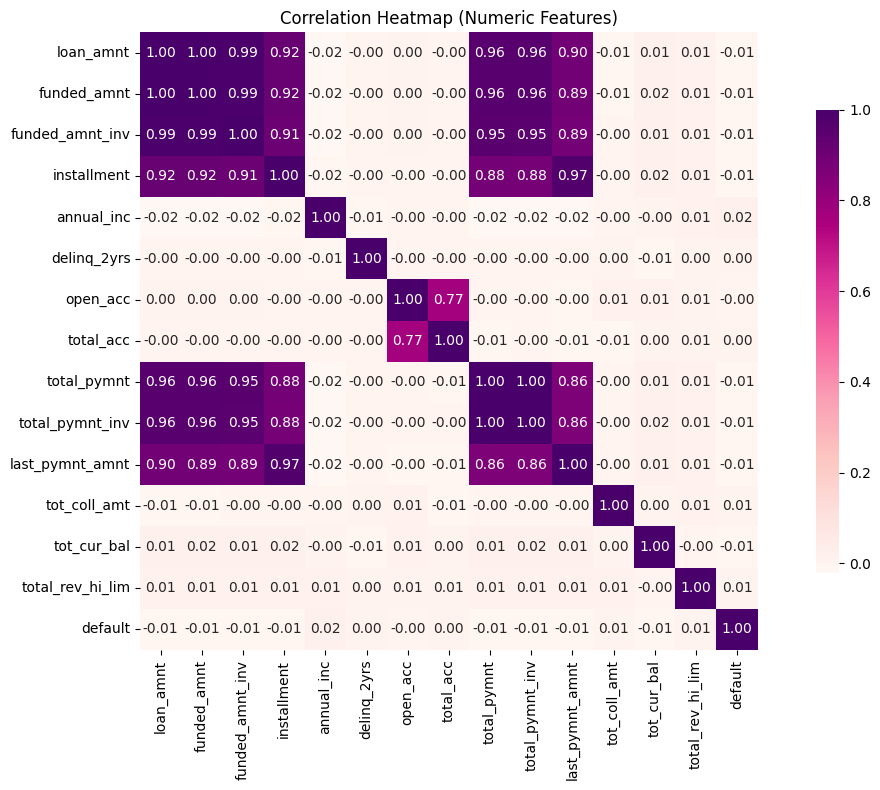

In [8]:
# Korelasyonları inceleyelim.
corr = df[numeric_cols + ["default"]].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr, cmap="RdPu", annot=True, fmt=".2f",
            square=True, cbar_kws={"shrink": 0.75})
plt.title("Correlation Heatmap (Numeric Features)")
plt.tight_layout()
plt.show()

Sayısal değişkenlerin hiçbirinde default değişkeniyle güçlü bir lineer korelasyon bulunmamaktadır. Bazı değişkenler arasında yüksek düzeyde inter-correlation görülmektedir (örneğin loan_amnt, funded_amnt, funded_amnt_inv). Bu multicollinearity, özellikle Logistic Regression için sorun yaratırken, ağaç tabanlı modeller (örn. XGBoost) bu duruma karşı daha dayanıklıdır. Bu nedenle mutlaka bir ağaç tabanlı model deneyeceğim.


Sonuç olarak: Feature selection veya dimensionality reduction gerekebilir.

## Categorical Feature Analysis

In [9]:
# Kategorik Sütunları inceleyelim.
for col in categorical_cols:
    print(f"Unique sayısı: {df[col].nunique()}\n")
    print(f"\nUnique counts {col}:")
    print(df[col].value_counts().head())

Unique sayısı: 6


Unique counts emp_title:
emp_title
Engineer          2587
Developer         2535
Data Scientist    2511
Manager           2465
Analyst           2458
Name: count, dtype: int64
Unique sayısı: 11


Unique counts emp_length:
emp_length
< 1 year     1427
6 years      1406
10+ years    1378
8 years      1372
7 years      1365
Name: count, dtype: int64
Unique sayısı: 2


Unique counts term:
term
36    10502
60     4498
Name: count, dtype: int64
Unique sayısı: 2


Unique counts default:
default
0    14550
1      450
Name: count, dtype: int64


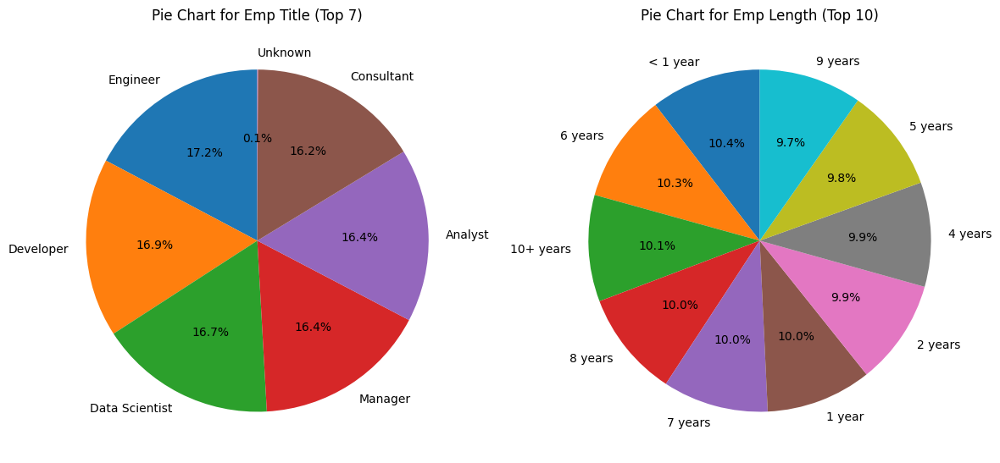

In [10]:
# EMP TITLE - EMP LENGTH için pie chart ile dağılım yüzdelerine bakalım.
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
target_cols = ['emp_title', 'emp_length']

for ax, col in zip(axes, target_cols):
    counts = df[col].fillna('Unknown').value_counts().head(10)
    ax.pie(counts, labels=counts.index, autopct='%1.1f%%',
           startangle=90)
    ax.set_title(f"Pie Chart for {col.replace('_', ' ').title()} (Top {len(counts)})")

plt.tight_layout()
plt.show()

In [11]:
# EMP_TITLE vs Income
print(df.groupby("emp_title")['annual_inc'].mean())

# EMP_LENGTH vs Income
print(df.groupby("emp_length")['annual_inc'].mean())

emp_title
Analyst           188003.929043
Consultant        190203.975732
Data Scientist    189188.326307
Developer         187592.277311
Engineer          188313.427169
Manager           186261.457767
Name: annual_inc, dtype: float64
emp_length
1 year       188005.005216
10+ years    189720.880882
2 years      187824.574721
3 years      188636.049612
4 years      183687.448042
5 years      191232.692131
6 years      187070.984116
7 years      185210.117385
8 years      193975.829123
9 years      186904.465796
< 1 year     188475.116312
Name: annual_inc, dtype: float64


Bulgular:
- emp_title ve emp_length değişkenlerinin dağılımı neredeyse uniform görünüyor.
- Bu değişkenlerin yıllık gelir gibi önemli finansal değişkenlerle anlamlı bir ilişkisi olmadığı da gözlemleniyor.
- Dolayısıyla bu iki sütun, simüle edilmiş veri yapısına benzer şekilde davranıyor ve model açısından ayrıştırıcı (predictive) bilgi taşımıyor gibi görünüyor.

## Değişkenlerin Target ile ilişkisi

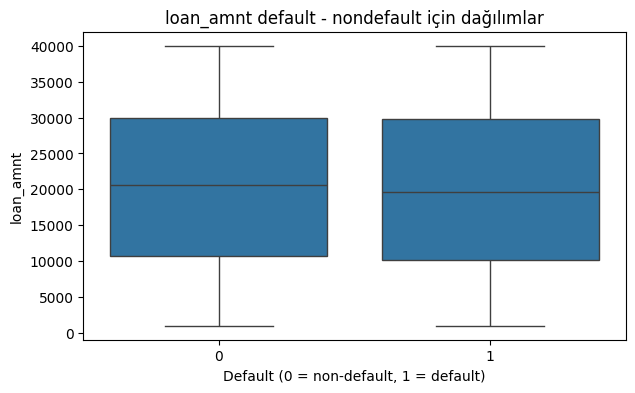

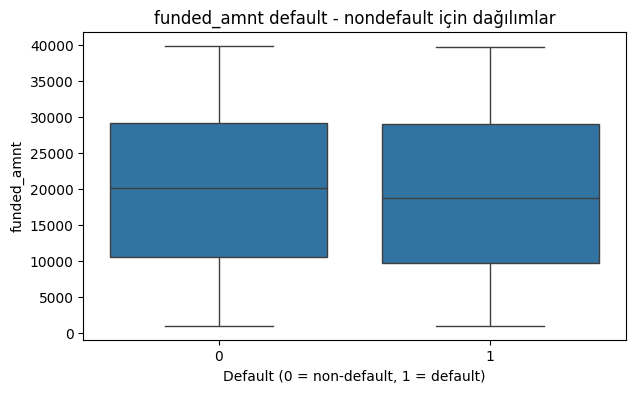

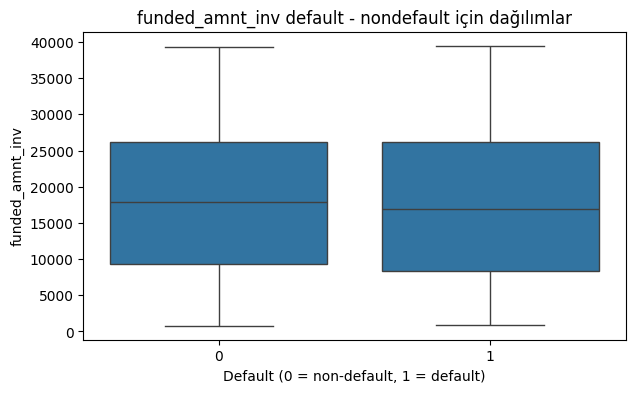

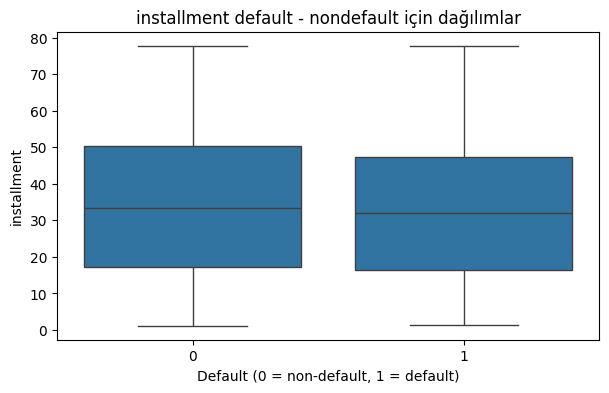

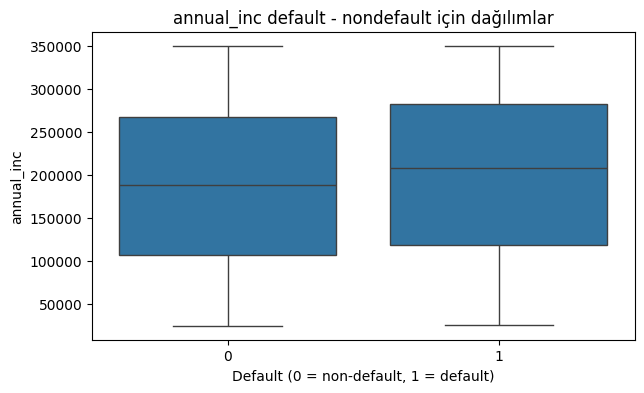

...

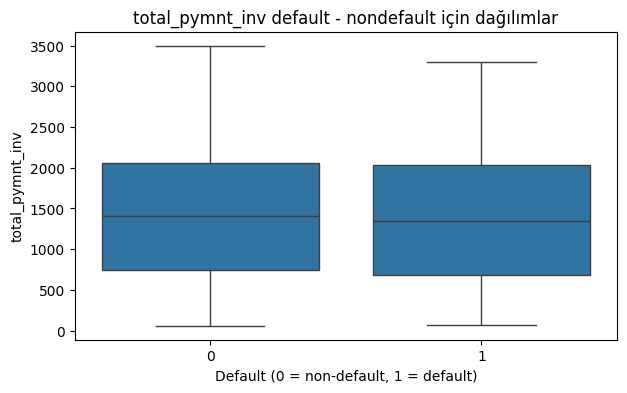

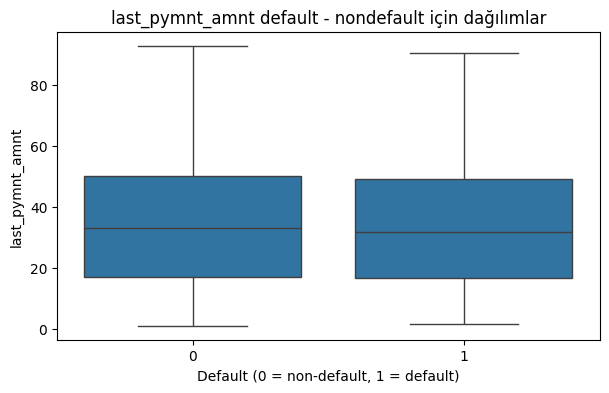

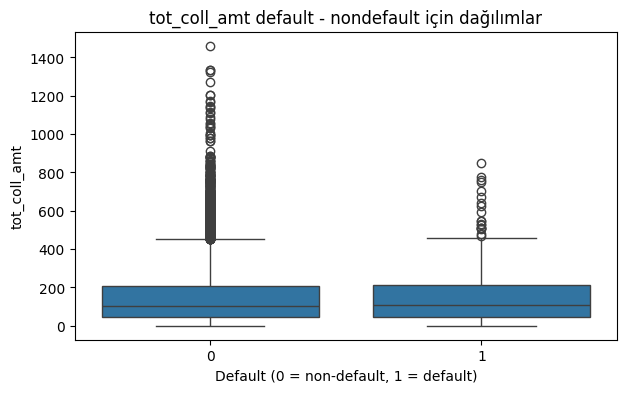

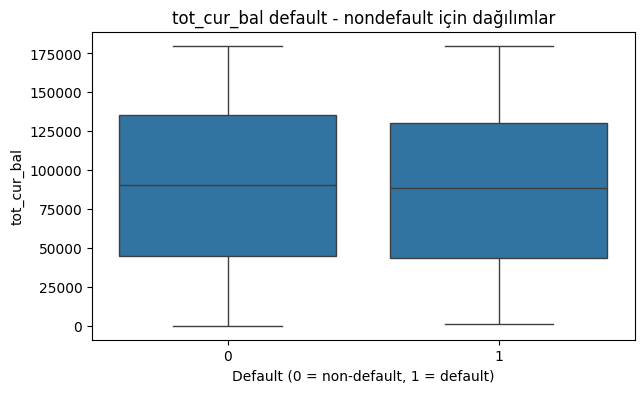

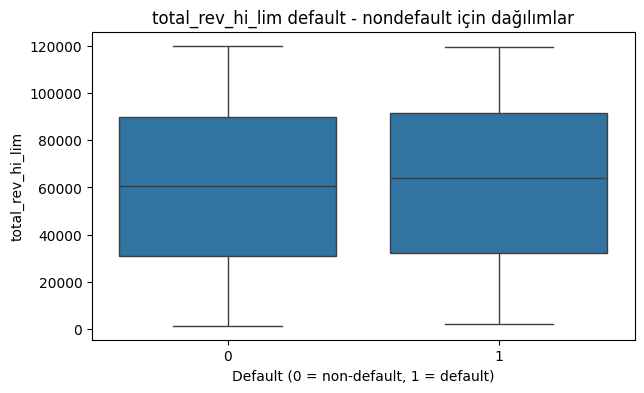

In [12]:
for col in numeric_cols:
    plt.figure(figsize=(7,4))
    sns.boxplot(x="default", y=col, data=df)
    plt.title(f"{col} default - nondefault için dağılımlar")
    plt.xlabel("Default (0 = non-default, 1 = default)")
    plt.show()

Numerik değişkenlerin default (0–1) sınıflarına göre dağılımlarına baktığımda, default eden ve etmeyen müşteriler arasında belirgin bir ayrım yaratacak güçlü bir dağılım farkı olmadığını görüyorum.

Çoğu numerik değişken, iki sınıf arasında neredeyse aynı dağılımlara sahip.

Bu durum, veri setindeki ayrıştırıcılığın düşük olduğunu ve modellerin default sınıfını yakalamakta zorlanabileceğini gösteriyor.

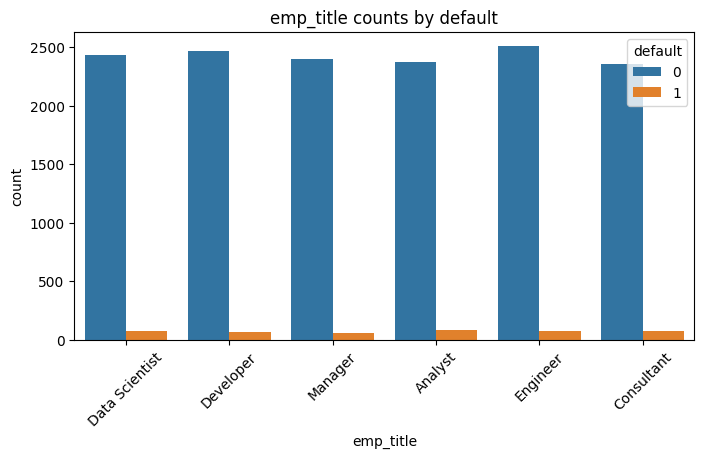

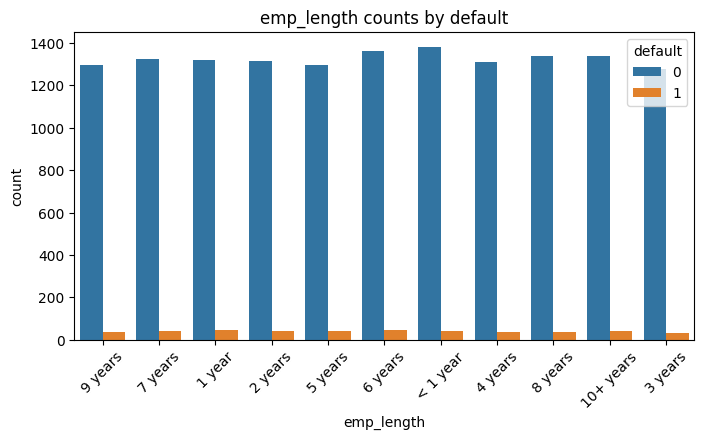

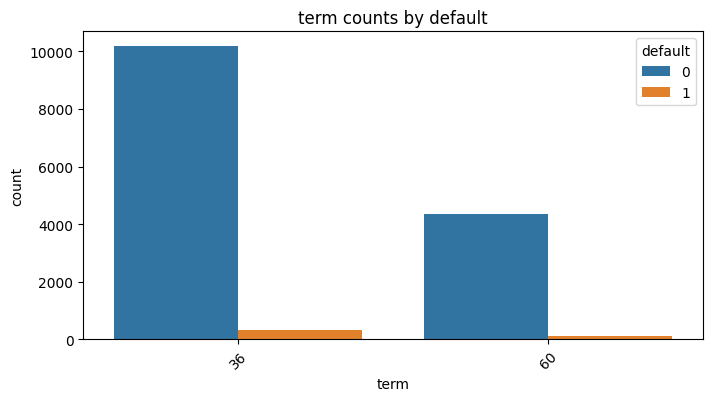

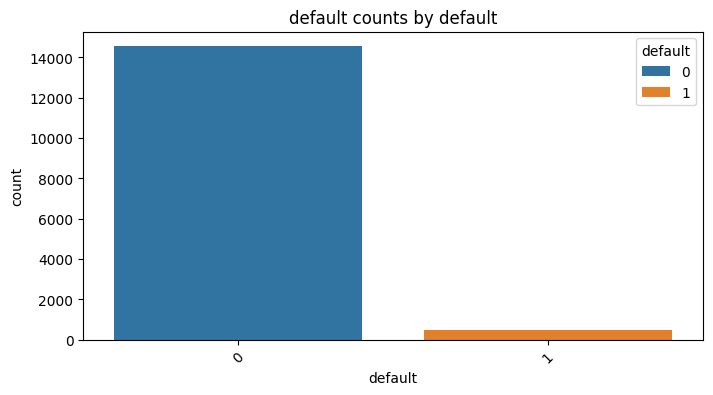

In [13]:
for col in categorical_cols:
    plt.figure(figsize=(8,4))
    sns.countplot(data=df, x=col, hue="default")
    plt.title(f"{col} counts by default")
    plt.xticks(rotation=45)
    plt.show()

Kategorik değişkenler (emp_length, emp_title vb.) default sınıfına göre incelendiğinde, default 0 ve 1 arasında anlamlı bir dağılım farklılığı bulunmadığını görüyorum. Kategorik özelliklerin frekans dağılımları oldukça benzer şekilde ilerliyor ve default sınıfı için ayırt edici bir bilgi taşımıyor gibi görünüyor.

Yani buradan şöyle bir yorum yapamıyorum: emp_length < 1 olan kullanıcıların default etme riski emp_length > 10 olan kullanıcılardan fazladır.

# Missing Value and Imputation by Business Insight

Bu bölümde veri setindeki eksik değerleri (NA) sistematik şekilde analiz edip, her değişken için iş kurallarına dayalı ve istatistiksel olarak anlamlı bir doldurma stratejisi uyguladım.

NA değerleri doğrudan ortalama ile doldurmak yerine diğer değişkenlerden faydalanarak ilerledim.

Veri seti içerisinde pek outlier bulunmadığı için mean-median kullanımı pek fark yaratmayacaktır.

Yaklaşımımı iki örnek olarak:
- annual_inc: Yıllık gelir değişkeni hem işsel hem de risk modelleri açısından kritik. Önce emp_title ve emp_length kırılımlarına göre median doldurma uygulandı. Kalan NA değerleri global median ile doldurum.

- loan_amnt, funded_amnt, funded_amnt_inv: Bu üç değişken arasında güçlü ilişki olduğunu gözlemledim. NA doldurma işlemini bu ilişkilerden faydalanarak yaptım:
    * Eksik değerleri doldurmak için funding_ratio = funded_amnt_inv / funded_amnt hesapladım.
    * Eğer loan_amnt eksik ama funded_amnt biliniyorsa, loan_amnt = funded_amnt.
    * Eğer funded_amnt eksik ama funded_amnt_inv biliniyorsa, funded_amnt = funded_amnt_inv / median_ratio.
    * İki değer de eksikse, global median ile doldurdum.
	* Tutarlılık kontrolü:
	    * funded_amnt <=(küçük eşittir) loan_amnt
	    * funded_amnt_inv <= funded_amnt

In [14]:
# NA değerleri sayılarıyla birlikte görelim.
print(df.isnull().sum().sort_values(ascending=False))

annual_inc          238
total_pymnt         212
tot_cur_bal         170
funded_amnt_inv     156
total_pymnt_inv     150
funded_amnt         140
last_pymnt_amnt      74
total_rev_hi_lim     55
loan_amnt            44
total_acc            30
tot_coll_amt         22
delinq_2yrs          15
open_acc             14
installment           9
emp_title             8
emp_length            0
term                  0
default               0
dtype: int64


In [15]:
df["delinq_2yrs"] = df["delinq_2yrs"].fillna(df["delinq_2yrs"].median())
df["open_acc"] = df["open_acc"].fillna(df["open_acc"].median())

# total_acc için median değer
median_total_acc = df["total_acc"].median()

# Boş total_acc değerlerini median ile doldur
df["total_acc"] = df["total_acc"].fillna(median_total_acc)

# Tutarsızlık kontrolü:
# Eğer total_acc < open_acc oluyorsa total_acc = open_acc yapalım.
df.loc[df["total_acc"] < df["open_acc"], "total_acc"] = df["open_acc"]

print("Hatalı gözlem sayısı kontrolü open_acc > total_acc: ", len(df[df['total_acc'] < df['open_acc']]))

Hatalı gözlem sayısı kontrolü open_acc > total_acc:  0


In [16]:
# Annual_inc değerlerini meslek ve yıla göre dolduralım.
df["annual_inc"] = df.groupby(["emp_title", "emp_length"])["annual_inc"].transform(lambda x: x.fillna(x.median()))
df["annual_inc"] = df["annual_inc"].fillna(df["annual_inc"].median())

print("annual_inc NA değer kontrolü:", df["annual_inc"].isna().sum())

annual_inc NA değer kontrolü: 0


In [17]:
# NA değer doldurma işlemlerine devam etmek için bin'ler oluşturalım.
df["open_acc_bin"] = pd.qcut(df["open_acc"], q=4, duplicates="drop")

df["total_acc_bin"] = pd.qcut(df["total_acc"], q=4, duplicates="drop")

df["annual_inc_bin"] = pd.qcut(df["annual_inc"], q=4, duplicates="drop")

# Hiç hesabı olmayan müşterinin limiti olamaz bu nedenle NA değil, 0 doğrudur.
df.loc[(df["open_acc"] == 0) & (df["total_rev_hi_lim"].isna()), "total_rev_hi_lim"] = 0

df["total_rev_hi_lim"] = df.groupby(["open_acc_bin", "total_acc_bin", "annual_inc_bin"])["total_rev_hi_lim"]\
                        .transform(lambda x: x.fillna(x.median()))

df["total_rev_hi_lim"] = df["total_rev_hi_lim"].fillna(df["total_rev_hi_lim"].median())

print("total_rev_hi_lim NA değer kontrolü::", df["total_rev_hi_lim"].isna().sum())

total_rev_hi_lim NA değer kontrolü:: 0


/var/folders/_g/j2wfkkhd07j4h6c5knpkn6dc0000gn/T/ipykernel_30314/2380285412.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df["total_rev_hi_lim"] = df.groupby(["open_acc_bin", "total_acc_bin", "annual_inc_bin"])["total_rev_hi_lim"]\


In [18]:
df["rev_hi_lim_bin"] = pd.qcut(df["total_rev_hi_lim"], q=4, duplicates="drop")

df.loc[(df["open_acc"] == 0) & (df["tot_cur_bal"].isna()), "tot_cur_bal"] = 0

df["tot_cur_bal"] = df.groupby(
    ["open_acc_bin", "total_acc_bin", "rev_hi_lim_bin"]
)["tot_cur_bal"].transform(lambda x: x.fillna(x.median()))

df["tot_cur_bal"] = df["tot_cur_bal"].fillna(df["tot_cur_bal"].median())

print("tot_cur_bal NA değer kontrolü::", df["tot_cur_bal"].isna().sum())

tot_cur_bal NA değer kontrolü:: 0


/var/folders/_g/j2wfkkhd07j4h6c5knpkn6dc0000gn/T/ipykernel_30314/2771063886.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df["tot_cur_bal"] = df.groupby(


In [19]:
# Funding ratio hesaplayarak loan_amnt değerini dolduralım.
df["funding_ratio"] = df["funded_amnt_inv"] / df["funded_amnt"]
median_ratio = df["funding_ratio"].median()
print("Median funding ratio:", median_ratio)

df.loc[
    df["loan_amnt"].isna() & df["funded_amnt"].notna(),
    "loan_amnt"
] = df.loc[
    df["loan_amnt"].isna() & df["funded_amnt"].notna(),
    "funded_amnt"
]

df["loan_amnt"] = df["loan_amnt"].fillna(df["loan_amnt"].median())

# FUNDED_AMNT için muhtemel iki duruma göre doldurma işlemini yapalım.
# durum 1: funded_amnt NA ama funded_amnt_inv mevcutsa: funded_amnt = funded_amnt_inv / median_ratio
df.loc[
    df["funded_amnt"].isna() & df["funded_amnt_inv"].notna(),
    "funded_amnt"
] = df["funded_amnt_inv"] / median_ratio

# durum 2: funded_amnt & funded_amnt_inv ikisi de NA ise: funded_amnt = median funded_amnt
df["funded_amnt"] = df["funded_amnt"].fillna(df["funded_amnt"].median())

# İş kuralı: funded_amnt > loan_amnt olamaz
df.loc[df["funded_amnt"] > df["loan_amnt"], "funded_amnt"] = df["loan_amnt"]


# FUNDED_AMNT_INV DOLDURMA:
# funded_amnt_inv NA ise: funded_amnt_inv = funded_amnt * median_ratio
df.loc[
    df["funded_amnt_inv"].isna(),
    "funded_amnt_inv"
] = df["funded_amnt"] * median_ratio

print("\nNA Kontrol Sonuçları:")
print(df[["loan_amnt", "funded_amnt", "funded_amnt_inv"]].isna().sum())

# Tutarlılık kontrolleri:
print("\nTutarlılık Kontrolleri:")
print("funded_amnt > loan_amnt =", 
      (df["funded_amnt"] > df["loan_amnt"]).sum())

print("Negatif funded_amnt:", (df["funded_amnt"] < 0).sum())
print("Negatif funded_amnt_inv:", (df["funded_amnt_inv"] < 0).sum())
print("Negatif loan_amnt:", (df["loan_amnt"] < 0).sum())

Median funding ratio: 0.8993327531186539

NA Kontrol Sonuçları:
loan_amnt          0
funded_amnt        0
funded_amnt_inv    0
dtype: int64

Tutarlılık Kontrolleri:
funded_amnt > loan_amnt = 0
Negatif funded_amnt: 0
Negatif funded_amnt_inv: 0
Negatif loan_amnt: 0


In [20]:
df["tot_coll_amt"] = df["tot_coll_amt"].fillna(df["tot_coll_amt"].median())

In [21]:
df["installment_ratio"] = df["installment"] / df["funded_amnt"]

# Term bazında median ratio hesapla
ratio_by_term = df.groupby("term")["installment_ratio"].median()
print("Term bazlı installment ratio:")
print(ratio_by_term)

for t in df["term"].unique():
    mask = (df["term"] == t) & (df["installment"].isna())
    df.loc[mask, "installment"] = df.loc[mask, "funded_amnt"] * ratio_by_term[t]

print("\nKalan NA sayısı:", df["installment"].isna().sum())

Term bazlı installment ratio:
term
36    0.001993
60    0.001196
Name: installment_ratio, dtype: float64

Kalan NA sayısı: 0


In [22]:
# Kaydı olmayan meslekler icin Unknown girelim.
df["emp_title"] = df["emp_title"].fillna("Unknown") 

In [23]:
df["payment_ratio"] = df["total_pymnt_inv"] / df["total_pymnt"]

payment_ratio_median = df["payment_ratio"].median()
print("Median payment ratio:", payment_ratio_median)

df.loc[df["total_pymnt"].isna(), "total_pymnt"] = df.loc[df["total_pymnt"].isna(), "total_pymnt_inv"] / payment_ratio_median
df.loc[df["total_pymnt_inv"].isna(), "total_pymnt_inv"] = df.loc[df["total_pymnt_inv"].isna(), "total_pymnt"] * payment_ratio_median

df.loc[df["total_pymnt"] > df["funded_amnt"], "total_pymnt"] = df["funded_amnt"]

df.loc[df["total_pymnt_inv"] > df["total_pymnt"], "total_pymnt_inv"] = df["total_pymnt"]

print(df[["total_pymnt", "total_pymnt_inv"]].isna().sum())

Median payment ratio: 0.950197046468321
total_pymnt        7
total_pymnt_inv    7
dtype: int64


In [24]:
# Hem total_pymnt hem total_pymnt_inv aynı anda NA olan satırları bul
mask = df["total_pymnt"].isna() & df["total_pymnt_inv"].isna()

print("Silinecek satır sayısı:", mask.sum())

# Silme işlemi
df = df[~mask].reset_index(drop=True)

Silinecek satır sayısı: 7


In [25]:
median_inst_lastratio = (df["installment"] / df["last_pymnt_amnt"]).median()

df.loc[df["last_pymnt_amnt"].isna(), "last_pymnt_amnt"] = df.loc[df["last_pymnt_amnt"].isna(), "installment"] / median_ratio

print("Kalan NA:", df["last_pymnt_amnt"].isna().sum())

Kalan NA: 0


In [26]:
# NA deger kontrolu yapalim tekrardan.
print(df.isna().sum())

loan_amnt              0
funded_amnt            0
funded_amnt_inv        0
term                   0
installment            0
emp_title              0
emp_length             0
annual_inc             0
delinq_2yrs            0
open_acc               0
total_acc              0
total_pymnt            0
total_pymnt_inv        0
last_pymnt_amnt        0
tot_coll_amt           0
tot_cur_bal            0
total_rev_hi_lim       0
default                0
open_acc_bin           0
total_acc_bin          0
annual_inc_bin         0
rev_hi_lim_bin         0
funding_ratio        287
installment_ratio      9
payment_ratio        348
dtype: int64


# Feature Engineering

In [27]:
# Daha once kendi olusturdugum sutunlari siliyorum
df = df.drop(columns=["funding_ratio", "installment_ratio", "payment_ratio"])

Modelleme sürecini geliştirebilme potansiyeli taşıyan yeni featurelar üretiyorum.

In [28]:
# Müşteri kredi kartı, limitli hesaplar vb. limitinin ne kadarını kullanıyor: Borç / Limit
df["revol_util"] = df["tot_cur_bal"] / (df["total_rev_hi_lim"])

# Kredi / Gelir
df["loan_to_income"] = df["loan_amnt"] / (df["annual_inc"])

# Aylık taksit / Gelir
df["installment_to_income"] = df["installment"] / (df["annual_inc"])

# Açık hesap / Toplam hesap
df["acc_ratio"] = df["open_acc"] / (df["total_acc"])

# Kredi büyüklüğü x vade etkisi
df["loan_term_interaction"] = df["loan_amnt"] * df["term"]

# Mevcut borç / Kredi büyüklüğü
df["rev_balance_ratio"] = df["tot_cur_bal"] / (df["loan_amnt"])

In [29]:
# emp_length sütununu modelde numerik olarak kullanmak için emp_length_num oluşturuyorum.
def encode_emp_length(value):
    if value == "< 1 year":
        return 0
    if value == "10+ years":
        return 10
    return int(value.split()[0])

df["emp_length_num"] = df["emp_length"].apply(encode_emp_length)
df["emp_length_num"] = (df["emp_length_num"]).astype(int)

In [30]:
# term değişkenini binary hale getiriyorum 60 ise 1 değilse 0.
df["term_60"] = (df["term"] == 60).astype(int)

In [31]:
categorical_cols = [
    "emp_title",
    "emp_length",
]

for col in categorical_cols:
    df[col] = df[col].astype("category")

## Multicollinearity control for Logistic Regression

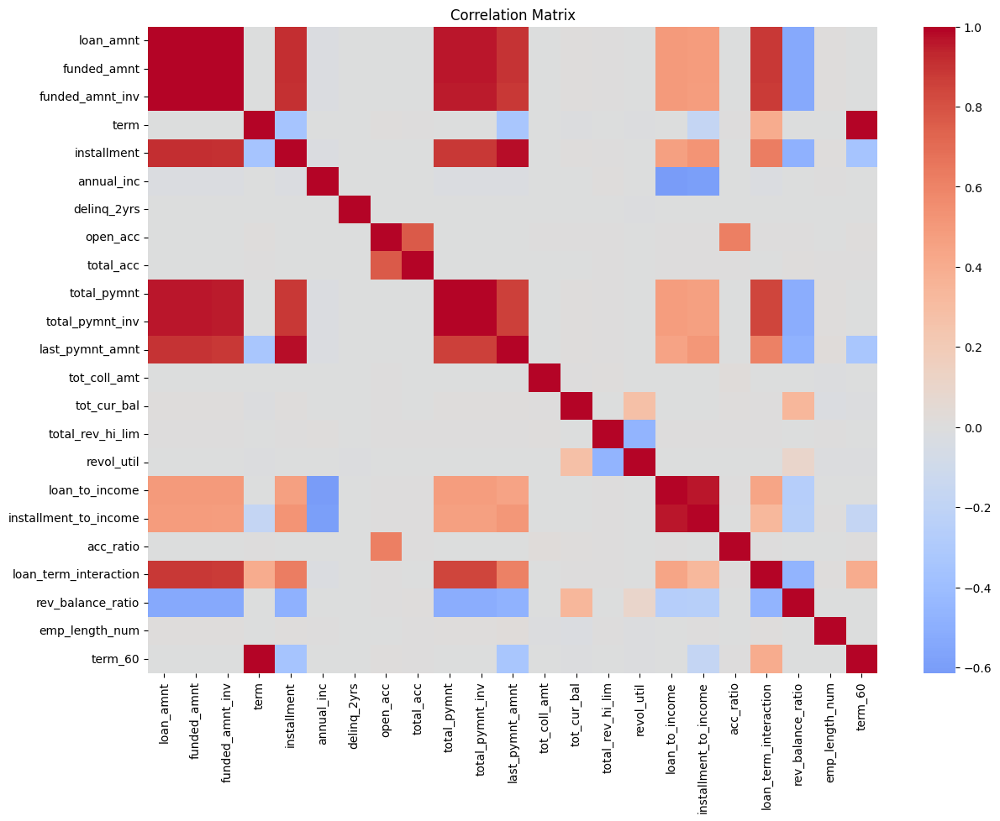

In [32]:
numeric_cols = df.select_dtypes(include=["float64", "int64"]).columns.tolist()
numeric_cols = [col for col in numeric_cols if col != "default"]  # target çıkar

plt.figure(figsize=(14, 10))
sns.heatmap(df[numeric_cols].corr(), cmap="coolwarm", center=0)
plt.title("Correlation Matrix")
plt.show()

In [33]:
# VIF hesaplaması için numeric dataframe
X = df[numeric_cols].copy()

vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif_data.sort_values("VIF", ascending=False)

,feature,VIF
0,loan_amnt,393484.786872
4,installment,141709.327489
19,loan_term_interaction,102362.324354
1,funded_amnt,685.436399
3,term,502.624447
9,total_pymnt,283.219003
10,total_pymnt_inv,270.911476
2,funded_amnt_inv,58.073452
22,term_60,52.578369
7,open_acc,34.098627


In [34]:
print(vif_data.sort_values("VIF", ascending=False))

                  feature            VIF
0               loan_amnt  393484.786872
4             installment  141709.327489
19  loan_term_interaction  102362.324354
1             funded_amnt     685.436399
3                    term     502.624447
9             total_pymnt     283.219003
10        total_pymnt_inv     270.911476
2         funded_amnt_inv      58.073452
22                term_60      52.578369
7                open_acc      34.098627
16         loan_to_income      32.850299
17  installment_to_income      32.776431
8               total_acc      21.140856
11        last_pymnt_amnt      20.283123
18              acc_ratio      13.814689
5              annual_inc       1.957462
20      rev_balance_ratio       1.676086
15             revol_util       1.434734
14       total_rev_hi_lim       1.323241
13            tot_cur_bal       1.316387
21         emp_length_num       1.001473
12           tot_coll_amt       1.001163
6             delinq_2yrs       1.000985


# MODELLEME

Burada temelde aklıma gelen 3 farklı modeli deneyeceğim, Logistic Regression, KNN, XGBoost

**Logistic Regression beklentiler:** Daha önce değişkenleri incelerken pek bir linear ilişkiye rastlamadığım için bu tarafta çok iyi sonuç vermesini beklemiyorum.

**KNN:** Bu modeli kullanmaya logistic regression'da çok kötü sonuç aldıktan sonra karar verdim, veri setimin default'u açıklayıcılığından epey şüphelendiğim için çok basit bir model olan kNN denemek istedim.

**XGBoost:** Ensemble bir model olarak karmaşık patternleri yakalamak için de oldukça iyi bir modeldir, bu nedenle mutlaka denemek istedim.

## Logistic Regression

Logistic Regression öncesi daha önce de bahsettiğim gibi multicollinearity testi yapıyorum.

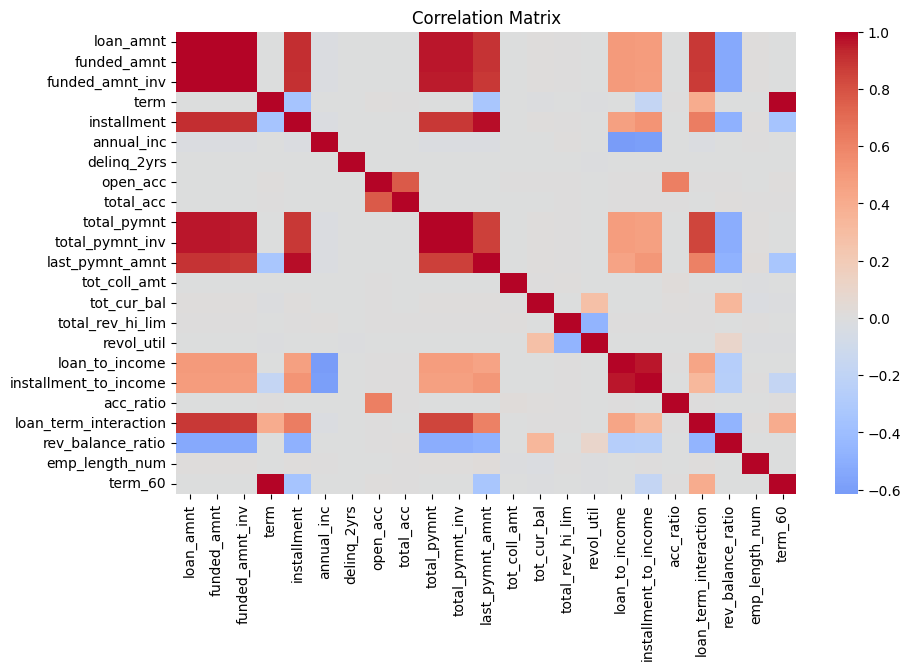

In [35]:
numeric_cols = df.select_dtypes(include=["float64", "int64"]).columns.tolist()
numeric_cols = [col for col in numeric_cols if col != "default"]  # target numeric cols içinden çıkaralım.

plt.figure(figsize=(10, 6))
sns.heatmap(df[numeric_cols].corr(), cmap="coolwarm", center=0)
plt.title("Correlation Matrix")
plt.show()

In [36]:
# VIF hesaplaması
X = df[numeric_cols].copy()

vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif_data.sort_values("VIF", ascending=False)

,feature,VIF
0,loan_amnt,393484.786872
4,installment,141709.327489
19,loan_term_interaction,102362.324354
1,funded_amnt,685.436399
3,term,502.624447
9,total_pymnt,283.219003
10,total_pymnt_inv,270.911476
2,funded_amnt_inv,58.073452
22,term_60,52.578369
7,open_acc,34.098627


Tam da önceden tahmin ettiğimiz gibi çok yüksek inter correlation sahip değişkenler var bunlardan seçim yaparak ilerleyelim, hepsini birlikte kullanmayalım. Burada L1 regularization uygulamayı tercih ettim.

In [37]:
from sklearn.model_selection import GridSearchCV

# Feature setimizi tanimlayalim.
lr_features = [
    'loan_amnt',
    'funded_amnt',
    'funded_amnt_inv',
    'installment',
    'annual_inc',
    'open_acc',
    'total_acc',
    'total_pymnt',
    'total_pymnt_inv',
    'last_pymnt_amnt',
    'tot_coll_amt',
    'tot_cur_bal',
    'total_rev_hi_lim',
    'emp_length_num',
    'delinq_2yrs',
    'term_60',
    'revol_util',
    'loan_to_income',
    'installment_to_income',
    'acc_ratio',
    'loan_term_interaction',
    'rev_balance_ratio'
    ]

df_model = df[lr_features + ["default"]].copy()

print("Feature Set")
print(df_model.columns)
print("\nShape:", df_model.shape)

df_encoded = df_model.copy()
print("Encoded dataframe shape:", df_encoded.shape)

# target ve features
X = df_encoded.drop("default", axis=1)
y = df_encoded["default"]

# Train-test split
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

print("\nTrain shape:", X_train_full.shape)
print("Test shape:", X_test.shape)
print("Default ratio (train):", y_train_full.mean())
print("Default ratio (test):", y_test.mean())

# L1 Pipeline
l1_log_reg_pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(
        penalty='l1',
        solver='liblinear',
        class_weight="balanced",
        max_iter=1000  # Daha karmaşık tuning için iterasyonu artırabiliriz
    ))
])

# L1 katsayısı için grid belirleyelim
param_grid = {
    'model__C': [0.001, 0.01, 0.1, 1.0, 5.0]
}

# Stratified K Fold kullanalım.
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid Search CV
# En iyi modeli ROC AUC skoruna göre seçsin
# n_jobs=-1 tüm CPU çekirdeklerini kullan.
grid_search = GridSearchCV(
    estimator=l1_log_reg_pipeline,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=cv,
    n_jobs=-1,
    verbose=1
)

print("\n===== GridSearchCV (L1 Tuning) BAŞLATIYOR... =====")

# GridSearchCV'yi tüm eğitim verisiyle eğitiyoruz
grid_search.fit(X_train_full, y_train_full)
print("Optimizasyon tamamlandı.")

print("\n===== OPTİMİZASYON SONUÇLARI =====")

# En iyi skoru ve o skoru veren parametreyi göster
print(f"En iyi 'C' parametresi: {grid_search.best_params_}")
print(f"En iyi 'C' ile Ortalama CV ROC-AUC Skoru: {grid_search.best_score_:.4f}")

# Detaylı sonuçlar
results_df = pd.DataFrame(grid_search.cv_results_)
print("\nTüm 'C' Değerleri İçin Sonuçlar:")
print(results_df[['param_model__C', 'mean_test_score', 'std_test_score', 'rank_test_score']])

print("\n===== FEATURE SELECTION =====")

# En iyi modeli alalım
best_model = grid_search.best_estimator_

# Modelin katsayılarını çekelim
coefficients = best_model.named_steps['model'].coef_[0]
coef_series = pd.Series(coefficients, index=X.columns)

print(f"\nEn iyi C parametresi ({grid_search.best_params_['model__C']}) ile;")
print(f"Toplam {len(coef_series)} özellikten {sum(coef_series == 0)} tanesi L1 tarafından elendi")

print("\n--- Modelde Kalan Özellikler ---")
print(coef_series[coef_series != 0])

Feature Set
Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment',
       'annual_inc', 'open_acc', 'total_acc', 'total_pymnt', 'total_pymnt_inv',
       'last_pymnt_amnt', 'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim',
       'emp_length_num', 'delinq_2yrs', 'term_60', 'revol_util',
       'loan_to_income', 'installment_to_income', 'acc_ratio',
       'loan_term_interaction', 'rev_balance_ratio', 'default'],
      dtype='object')

Shape: (14993, 23)
Encoded dataframe shape: (14993, 23)

Train shape: (11994, 22)
Test shape: (2999, 22)
Default ratio (train): 0.030015007503751877
Default ratio (test): 0.030010003334444816

===== GridSearchCV (L1 Tuning) BAŞLATIYOR... =====
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Optimizasyon tamamlandı.

===== OPTİMİZASYON SONUÇLARI =====
En iyi 'C' parametresi: {'model__C': 0.01}
En iyi 'C' ile Ortalama CV ROC-AUC Skoru: 0.5093

Tüm 'C' Değerleri İçin Sonuçlar:
   param_model__C  mean_test_score  std_test_score  ran

ROC-AUC skoruna bakarak şunu söyleyebiliriz ki model hiçbir şey öğrenemedi. Bu nedenle hiç test setine uygulamıyorum bile çünkü orada vereceği yanıtlar da rastgele olacaktır.

## XGBoost

Veride belirgin bir class imbalance problemi bulunduğu için, XGBoost modellerinde iki farklı stratejiyi değerlendirdim:
1. scale_pos_weight parametresini kullanarak minority class’a ağırlık verme
2.	SMOTE kullanarak minority class’ı sentetik örneklerle dengeleme

Her iki yöntemi de karşılaştırmalı olarak test ettim ve cross-validation sonuçlarında daha yüksek ve daha stabil ROC-AUC sağlayan yaklaşım ile devam ettim.

In [38]:
xgb_feature_set = [
    'loan_amnt',
    'funded_amnt',
    'funded_amnt_inv',
    'installment',
    'annual_inc',
    'open_acc',
    'total_acc',
    'total_pymnt',
    'total_pymnt_inv',
    'last_pymnt_amnt',
    'tot_coll_amt',
    'tot_cur_bal',
    'total_rev_hi_lim',
    'emp_length_num',
    'delinq_2yrs',
    'term_60',
    'revol_util',
    'loan_to_income',
    'installment_to_income',
    'acc_ratio',
    'loan_term_interaction',
    'rev_balance_ratio',
]

df_xgb = df[xgb_feature_set + ["default"]].copy()

print("XGBoost Feature Set Shape:", df_xgb.shape)
print(df_xgb.head())

# Train-test split
X = df_xgb.drop(columns=["default"])
y = df_xgb["default"]

# Daha önce kullandığım random_state=42 ile aynı seti koruyoruz.
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)
print("Train default ratio:", y_train.mean())
print("Test default ratio:", y_test.mean())

XGBoost Feature Set Shape: (14993, 23)
   loan_amnt  funded_amnt  funded_amnt_inv  installment  annual_inc  open_acc  \
0    16795.0      16505.0          15094.0        32.66    228362.0       6.0   
1     1860.0       1848.0           1494.0         2.17    273685.0      14.0   
2    39158.0      37619.0          34683.0        76.14    165933.0      11.0   
3    12284.0      12266.0          11096.0        14.33    136818.0       7.0   
4     7265.0       6953.0           6651.0         8.48    114755.0      13.0   

   total_acc  total_pymnt  total_pymnt_inv  last_pymnt_amnt  ...  \
0       12.0      1459.92          1377.66            39.12  ...   
1       20.0       137.61           133.20             1.74  ...   
2       17.0      2688.63          2460.36            77.56  ...   
3       16.0       980.01           907.17            13.45  ...   
4       15.0       513.38           508.43             8.86  ...   

   emp_length_num  delinq_2yrs  term_60  revol_util  loan_to_inco

### XGBoost with SMOTE + HYPERPARAMETER TUNING (OPTUNA)

SMOTE kullanarak resampling yaptım ve target değişkenimdeki 0-1 sınıflarını dengelemeye çalıştım. 

Hyperparameter tuning için OPTUNA kütüphanesini kullandım.

In [39]:
def objective(trial):
    # Hyperparameter grid
    param = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 300),
        "max_depth": trial.suggest_int("max_depth", 3, 6),
        "learning_rate": trial.suggest_float("learning_rate", 0.05, 0.15),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 5.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 5.0),
        "objective": "binary:logistic",
        "eval_metric": "auc",
        "tree_method": "hist",
        "random_state": 42,
    }

    # SMOTE + XGB Pipeline
    model = ImbPipeline([
        ('smote', SMOTE(random_state=42, sampling_strategy=1.0)),
        ('xgb', XGBClassifier(**param))
    ])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    scores = cross_val_score(
        model,
        X_train,
        y_train,
        scoring="roc_auc",
        cv=cv,
        n_jobs=-1
    )

    return scores.mean()

In [40]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=500, show_progress_bar=True)

[I 2025-11-16 15:12:05,648] A new study created in memory with name: no-name-b19d766d-1e19-4a56-a874-5b44a9ecf837


  0%|          | 0/500 [00:00<?, ?it/s]

[I 2025-11-16 15:12:06,327] Trial 0 finished with value: 0.5231278443651808 and parameters: {'n_estimators': 64, 'max_depth': 6, 'learning_rate': 0.0769518167746537, 'subsample': 0.6392718270059253, 'colsample_bytree': 0.9367834156289907, 'gamma': 1.0997910106471704, 'min_child_weight': 14, 'reg_lambda': 3.3037275182063426, 'reg_alpha': 2.1849776565854357}. Best is trial 0 with value: 0.5231278443651808.
[I 2025-11-16 15:12:06,780] Trial 1 finished with value: 0.5184625496818966 and parameters: {'n_estimators': 71, 'max_depth': 4, 'learning_rate': 0.09125567132653523, 'subsample': 0.8798612125976578, 'colsample_bytree': 0.6046526770932534, 'gamma': 3.319058067706879, 'min_child_weight': 15, 'reg_lambda': 3.2043343372905024, 'reg_alpha': 0.15691780787256637}. Best is trial 0 with value: 0.5231278443651808.
[I 2025-11-16 15:12:07,231] Trial 2 finished with value: 0.5186280348876362 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.12528556470168606, 'subsample': 0.8

In [41]:
print("Best AUC:", study.best_value)
print("Best Params:", study.best_params)

Best AUC: 0.5374283657328254
Best Params: {'n_estimators': 54, 'max_depth': 6, 'learning_rate': 0.13253704085640167, 'subsample': 0.7031158442811423, 'colsample_bytree': 0.6571505394480354, 'gamma': 4.983745343181817, 'min_child_weight': 11, 'reg_lambda': 1.5580713926315863, 'reg_alpha': 3.680470856042114}


===== FINAL TEST ROC-AUC =====
0.4793819945762194

===== CLASSIFICATION REPORT =====
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      2909
           1       0.00      0.00      0.00        90

    accuracy                           0.97      2999
   macro avg       0.48      0.50      0.49      2999
weighted avg       0.94      0.97      0.95      2999


===== CONFUSION MATRIX =====
[[2898   11]
 [  90    0]]


<Figure size 700x600 with 0 Axes>

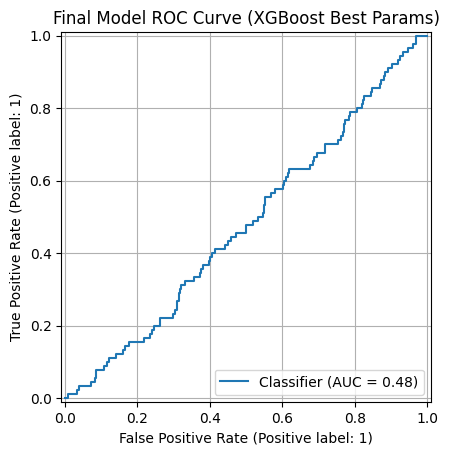

In [42]:
# Final model egitelim ve test seti uzerinde test edelim.
best_params = study.best_params

# BUILD FINAL MODEL (SMOTE + XGBoost)
final_model = ImbPipeline([
    ('smote', SMOTE(random_state=42, sampling_strategy=1.0)),
    
    ('xgb', XGBClassifier(
        **best_params,
        objective="binary:logistic",
        eval_metric="auc",
        random_state=42,
        tree_method="hist"
    ))
])

# TRAIN FINAL MODEL
final_model.fit(X_train, y_train)

# TEST PERFORMANCE
y_test_proba = final_model.predict_proba(X_test)[:, 1]
y_test_pred = (y_test_proba >= 0.5).astype(int)  # threshold = default

test_auc = roc_auc_score(y_test, y_test_proba)

print("===== FINAL TEST ROC-AUC =====")
print(test_auc)

print("\n===== CLASSIFICATION REPORT =====")
print(classification_report(y_test, y_test_pred))

print("\n===== CONFUSION MATRIX =====")
print(confusion_matrix(y_test, y_test_pred))

# ROC CURVE
plt.figure(figsize=(7,6))
RocCurveDisplay.from_predictions(y_test, y_test_proba)
plt.title("Final Model ROC Curve (XGBoost Best Params)")
plt.grid(True)
plt.show()

<Figure size 1200x800 with 0 Axes>

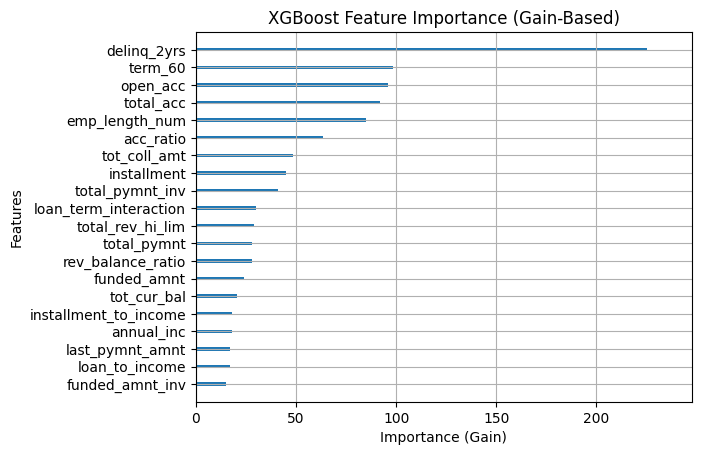

                  feature  importance_gain
14            delinq_2yrs       225.122910
15                term_60        98.608086
5                open_acc        95.907478
6               total_acc        91.863876
13         emp_length_num        84.799469
19              acc_ratio        63.372086
10           tot_coll_amt        48.424957
3             installment        44.835678
8         total_pymnt_inv        41.109470
20  loan_term_interaction        29.964996
12       total_rev_hi_lim        29.163868
7             total_pymnt        28.113321
21      rev_balance_ratio        27.908524
1             funded_amnt        23.837523
11            tot_cur_bal        20.517805
18  installment_to_income        17.793242
4              annual_inc        17.781326
9         last_pymnt_amnt        17.127720
17         loan_to_income        17.095913
2         funded_amnt_inv        15.099040
16             revol_util        14.635267
0               loan_amnt        12.296801


In [43]:
# Feature Importance

# Model
xgb_trained = final_model.named_steps["xgb"]
feature_names = X_train.columns

#  Feature Importance Grafiği
plt.figure(figsize=(12, 8))
plot_importance(
    xgb_trained,
    importance_type="gain",
    xlabel="Importance (Gain)",
    show_values=False,
    max_num_features=20
)
plt.title("XGBoost Feature Importance (Gain-Based)")
plt.show()

# Feature Importance tablomuz
importances = xgb_trained.get_booster().get_score(importance_type="gain")

# En önemliden önemsize sırala.
fi_df = pd.DataFrame({
    "feature": list(importances.keys()),
    "importance_gain": list(importances.values())
}).sort_values("importance_gain", ascending=False)

print(fi_df)

### XGBoost without SMOTE + HYPERPARAMETER TUNING (OPTUNA)

SMOTE’un sentetik örnek üretimi nedeniyle zaman zaman gereksiz noise yaratabilmesi ihtimaline karşı sınıf dengesizliği olan problemlerde doğrudan XGBoost’un kendi algoritması içinde kullanılan scale_pos_weight'i de denedim.

In [44]:
scale_pos_weight = (y_train.value_counts()[0] / y_train.value_counts()[1])

def objective(trial):
    # Hyperparameter grid
    param = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 300),
        "max_depth": trial.suggest_int("max_depth", 3, 6),
        "learning_rate": trial.suggest_float("learning_rate", 0.05, 0.15),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 5.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 5.0),
        "objective": "binary:logistic",
        "eval_metric": "auc",
        "tree_method": "hist",
        "random_state": 42,
        "scale_pos_weight": scale_pos_weight
    }

    model = XGBClassifier(**param)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    scores = cross_val_score(
        model,
        X_train,
        y_train,
        scoring="roc_auc",
        cv=cv,
        n_jobs=-1
    )

    return scores.mean()

In [45]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=500, show_progress_bar=True)

[I 2025-11-16 15:14:24,911] A new study created in memory with name: no-name-aec2efe6-0908-4187-a730-0cbd54415e12


  0%|          | 0/500 [00:00<?, ?it/s]

[I 2025-11-16 15:14:25,221] Trial 0 finished with value: 0.4819697998814207 and parameters: {'n_estimators': 177, 'max_depth': 4, 'learning_rate': 0.1154411347350789, 'subsample': 0.6883078375560248, 'colsample_bytree': 0.9258885590995608, 'gamma': 4.600451231780183, 'min_child_weight': 10, 'reg_lambda': 0.532241567312422, 'reg_alpha': 3.6084520889627694}. Best is trial 0 with value: 0.4819697998814207.
[I 2025-11-16 15:14:25,401] Trial 1 finished with value: 0.47788235676667157 and parameters: {'n_estimators': 70, 'max_depth': 4, 'learning_rate': 0.08629429369047278, 'subsample': 0.638087693756574, 'colsample_bytree': 0.9133287981914435, 'gamma': 0.13076774272701874, 'min_child_weight': 11, 'reg_lambda': 2.896911127459259, 'reg_alpha': 0.33786018429695364}. Best is trial 0 with value: 0.4819697998814207.
[I 2025-11-16 15:14:25,593] Trial 2 finished with value: 0.4751650833657372 and parameters: {'n_estimators': 93, 'max_depth': 3, 'learning_rate': 0.10120704980130919, 'subsample': 0.8

In [46]:
print("Best AUC:", study.best_value)
print("Best Params:", study.best_params)

Best AUC: 0.5053257543948158
Best Params: {'n_estimators': 93, 'max_depth': 5, 'learning_rate': 0.1020675430881155, 'subsample': 0.5495015890778034, 'colsample_bytree': 0.5137881519993799, 'gamma': 4.724502304082009, 'min_child_weight': 6, 'reg_lambda': 1.2095780299362457, 'reg_alpha': 1.0451382795319009}


Best Params: {'n_estimators': 93, 'max_depth': 5, 'learning_rate': 0.1020675430881155, 'subsample': 0.5495015890778034, 'colsample_bytree': 0.5137881519993799, 'gamma': 4.724502304082009, 'min_child_weight': 6, 'reg_lambda': 1.2095780299362457, 'reg_alpha': 1.0451382795319009}
===== FINAL TEST ROC-AUC =====
0.4607998166609374

===== CLASSIFICATION REPORT =====
              precision    recall  f1-score   support

           0       0.97      0.90      0.93      2909
           1       0.00      0.01      0.01        90

    accuracy                           0.87      2999
   macro avg       0.49      0.45      0.47      2999
weighted avg       0.94      0.87      0.90      2999


===== CONFUSION MATRIX =====
[[2611  298]
 [  89    1]]


<Figure size 700x600 with 0 Axes>

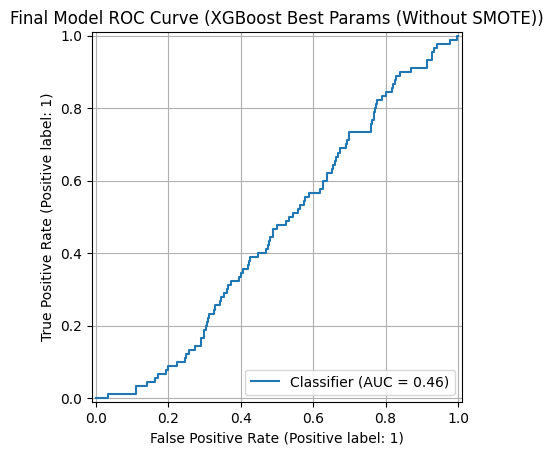

In [47]:
#  Optuna ile en iyi parametreyi alalim.
best_params = study.best_params
print("Best Params:", best_params)

# Final Model without SMOTE
final_model = XGBClassifier(
    **best_params,
    objective="binary:logistic",
    eval_metric="auc",
    random_state=42,
    tree_method="hist",
    scale_pos_weight=scale_pos_weight
)

# Train final model
final_model.fit(X_train, y_train)

# Test performance
y_test_proba = final_model.predict_proba(X_test)[:, 1]
y_test_pred = (y_test_proba >= 0.5).astype(int)

test_auc = roc_auc_score(y_test, y_test_proba)

print("===== FINAL TEST ROC-AUC =====")
print(test_auc)

print("\n===== CLASSIFICATION REPORT =====")
print(classification_report(y_test, y_test_pred))

print("\n===== CONFUSION MATRIX =====")
print(confusion_matrix(y_test, y_test_pred))

# ROC CURVE
plt.figure(figsize=(7,6))
RocCurveDisplay.from_predictions(y_test, y_test_proba)
plt.title("Final Model ROC Curve (XGBoost Best Params (Without SMOTE))")
plt.grid(True)
plt.show()

<Figure size 1200x800 with 0 Axes>

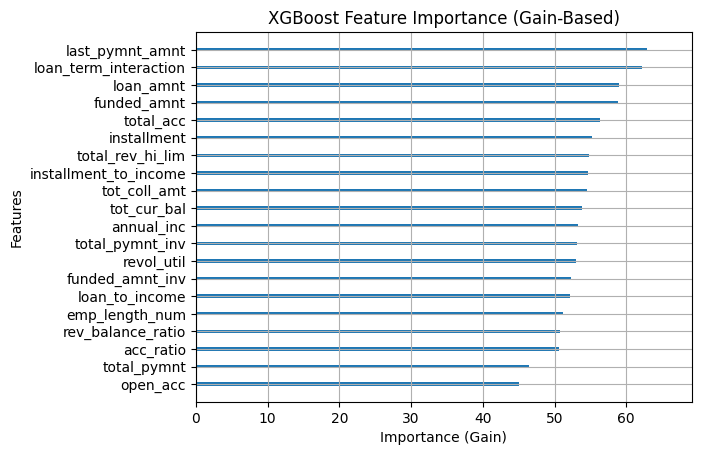


===== FEATURE IMPORTANCE TABLE (GAIN) =====
                  feature  importance_gain
9         last_pymnt_amnt        62.869202
20  loan_term_interaction        62.187786
0               loan_amnt        58.947083
1             funded_amnt        58.899536
6               total_acc        56.277607
3             installment        55.246906
12       total_rev_hi_lim        54.847103
18  installment_to_income        54.702877
10           tot_coll_amt        54.508774
11            tot_cur_bal        53.823395
4              annual_inc        53.259712
8         total_pymnt_inv        53.155807
16             revol_util        52.958920
2         funded_amnt_inv        52.316799
17         loan_to_income        52.108898
13         emp_length_num        51.153385
21      rev_balance_ratio        50.752117
19              acc_ratio        50.603218
7             total_pymnt        46.431545
5                open_acc        45.037117
15                term_60        42.985641
14       

In [48]:
# Feature Importance Grafigi
plt.figure(figsize=(12, 8))
plot_importance(
    final_model,
    importance_type="gain",
    xlabel="Importance (Gain)",
    show_values=False,
    max_num_features=20
)
plt.title("XGBoost Feature Importance (Gain-Based)")
plt.show()

# Feature importance tablosu
booster = final_model.get_booster()
importances = booster.get_score(importance_type="gain")

fi_df = pd.DataFrame({
    "feature": list(importances.keys()),
    "importance_gain": list(importances.values())
}).sort_values("importance_gain", ascending=False)

print("\n===== FEATURE IMPORTANCE TABLE (GAIN) =====")
print(fi_df)

## kNN

XGBoost ile en iyi performansı aldığım modelin feature importance bilgisini kullanarak en önemli 7 feature seçtim ve kNN ile bir deneme yaptım. Bu denemedeki temel amacım veri setinin target'ı açıklamak için yetersiz olduğundan emin olmaktır.

k-NN’de özellikle Mahalanobis mesafesini denedim çünkü bu mesafe metriği, değişkenler arasındaki kovaryans yapısını dikkate alarak ölçeklendirme yapar ve özellikle farklı varyanslara ve korelasyon yapılarına sahip veri setlerinde Öklid mesafesine göre daha anlamlı sonuç verebilir.

In [49]:
knn_feature_set = fi_df[:7]['feature'].to_list()

df_model = df[knn_feature_set + ["default"]].copy()
X = df_model.drop("default", axis=1)
y = df_model["default"]

X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

knn_pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier())
])

# Covariance + inverse covariance (Mahalanobis VI matrix)
cov_matrix = np.cov(X_train_full.values, rowvar=False)
VI_matrix = np.linalg.inv(cov_matrix)

param_grid = [
    {   # Euclidean
        "knn__metric": ["euclidean"],
        "knn__metric_params": [None],
        "knn__n_neighbors": [3,5,7,9,11,15],
        "knn__weights": ["uniform","distance"]
    },
    {   # Manhattan
        "knn__metric": ["manhattan"],
        "knn__metric_params": [None],
        "knn__n_neighbors": [3,5,7,9,11,15],
        "knn__weights": ["uniform","distance"]
    },
    {   # Mahalanobis
        "knn__metric": ["mahalanobis"],
        "knn__metric_params": [{"VI": VI_matrix}],
        "knn__n_neighbors": [3,5,7,9,11,15],
        "knn__weights": ["uniform","distance"]
    }
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

grid_knn = GridSearchCV(
    estimator=knn_pipeline,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=cv,
    n_jobs=-1,
    verbose=2
)

grid_knn.fit(X_train_full, y_train_full)

print("Best KNN Parameters:", grid_knn.best_params_)
print("Best CV ROC-AUC:", grid_knn.best_score_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END knn__metric=euclidean, knn__metric_params=None, knn__n_neighbors=3, knn__weights=uniform; total time=   0.0s
[CV] END knn__metric=euclidean, knn__metric_params=None, knn__n_neighbors=3, knn__weights=uniform; total time=   0.0s
[CV] END knn__metric=euclidean, knn__metric_params=None, knn__n_neighbors=3, knn__weights=uniform; total time=   0.0s
[CV] END knn__metric=euclidean, knn__metric_params=None, knn__n_neighbors=3, knn__weights=uniform; total time=   0.0s
[CV] END knn__metric=euclidean, knn__metric_params=None, knn__n_neighbors=3, knn__weights=uniform; total time=   0.0s
[CV] END knn__metric=euclidean, knn__metric_params=None, knn__n_neighbors=3, knn__weights=distance; total time=   0.0s
[CV] END knn__metric=euclidean, knn__metric_params=None, knn__n_neighbors=3, knn__weights=distance; total time=   0.0s
[CV] END knn__metric=euclidean, knn__metric_params=None, knn__n_neighbors=3, knn__weights=distance; total time

## Results and Suggestions

**Logistic Regression, XGBoost, kNN** modelleri denendi ancak hiçbiriyle anlamlı bir sonuç elde edilemedi. Sahip olduğumuz değişkenler target'ı açıklayamıyor.

Bu durumu görsel olarak bir nebze izah edebilmek için PCA kullandım ve veri setini 2D-3D hale getirdim. Bu grafik üzerinde default 0-1 değerleri için farklı renklendirmeler kullanarak farklı sınıflarımın dağılımlarını gösterdim. Bu dağılımlara da baktığımda anlamlı bir kümeleşme görünmüyor.

**Çözüm Önerisi:**
Bu problemde ilerleme kaydedebilmek için ilk yapılması gereken geliştirme, hedef değişkeni daha iyi açıklayabilecek ek değişkenlerin veri setine dahil edilmesidir. Mevcut değişken yapısıyla modelin default davranışını tahmin etmesi mümkün görünmemektedir.

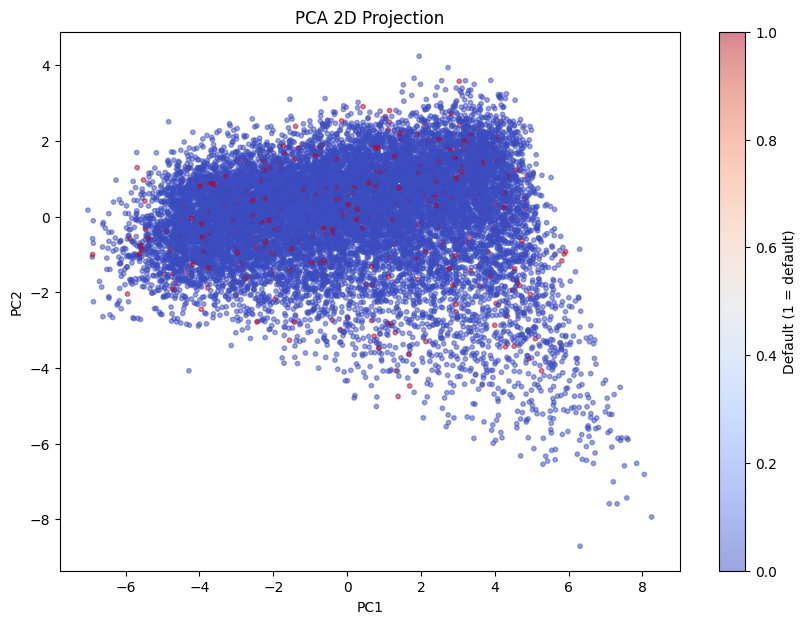

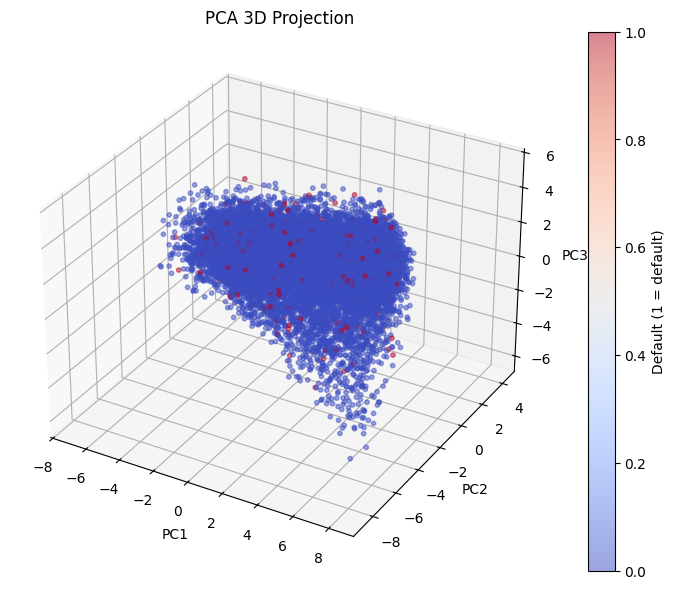

In [50]:
df_pca = df_xgb.drop(columns=["default"]).copy()
y = df_xgb["default"].values

# Standardization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_pca)

# PCA 2D
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_scaled)

plt.figure(figsize=(10, 7))
plt.scatter(
    X_pca_2d[:, 0],
    X_pca_2d[:, 1],
    c=y,
    cmap="coolwarm",
    alpha=0.5,
    s=10
)
plt.title("PCA 2D Projection")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.colorbar(label="Default (1 = default)")
plt.show()


# PCA 3D
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    X_pca_3d[:, 0],
    X_pca_3d[:, 1],
    X_pca_3d[:, 2],
    c=y,
    cmap="coolwarm",
    alpha=0.5,
    s=10
)

ax.set_title("PCA 3D Projection")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

fig.colorbar(scatter, label="Default (1 = default)")
plt.show()

***PCA ile veriyi 2D ve 3D boyutlara indirgeyerek incelediğimizde, default (0–1) sınıflarının herhangi bir kümelenme göstermediğini görüyoruz.***